# Лабораторная работа 3: Машина опорных векторов (SVM)

<img src="svm_img.png" width=350>

Результат лабораторной работы — **отчет** в формате ноутбуков IPython (ipynb-файл). Нам не интересен ваш код. Чем меньше кода, тем лучше всем: нам — меньше проверять, вам — проще найти ошибку или дополнить эксперимент.

Постарайтесь сделать ваш отчет интересным рассказом, последовательно отвечающим на вопросы из заданий. Ответы на вопросы должны быть полными, четкими и хорошо аргументированными.

## 1. Квадратичное программирование и QP-солвер

Квадратичное программирование (QP) — специальный тип задач математической оптимизации, заключающийся в нахождении точки минимума неотрицательно-определенной квадратичной формы (многомерная парабола) в присутствии линейных ограничений:
$$
\begin{gather}
    \frac{1}{2}\boldsymbol x^T\boldsymbol P\boldsymbol x + \boldsymbol q^T\boldsymbol x \to \min_{\boldsymbol x} \\
    \begin{aligned}
        \text{s.t.} \quad & \boldsymbol G\boldsymbol x \le \boldsymbol h \\
        & \boldsymbol A\boldsymbol x = \boldsymbol b
    \end{aligned}
\end{gather}
$$

Здесь $\boldsymbol P$ — симметричная матрица. В ограничениях $\boldsymbol G\boldsymbol x \le \boldsymbol h$ и $\boldsymbol A\boldsymbol x = \boldsymbol b$ под знаками равенства и неравенства подразумевается сравнение всех компонент векторов.

Задача квадратичного программирования хорошо изучена, существуют эффективные алгоритмы для ее решения. Имеется множество библиотек с солверами для задачи QP, вот некоторые из них:
 - [CVXOPT](http://cvxopt.org/) (свободно-распространяемая, Python) **рекомендуется к использованию**
 - [Mosek](https://www.mosek.com/) (коммерческая с возможностью получения академической лицензии, C, Java, MATLAB, .NET, R, Python)
 - [Matlab Optimization Toolbox](http://www.mathworks.com/help/optim/ug/quadprog.html) 

#### Задание

1. Установите QP-солвер, разберитесь с его интерфейсом.
2. Протестируйте солвер, решив простую задачу оптимизации в двумерном пространстве:
$$f(\boldsymbol x) = -8x_1 - 16x_2 + x_1^2 + 4x_2^2, \quad \text{s.t.:} \; x_1 + x_2 \leq 5, \; 0 \leq x_1 \leq 3, \; x_2 \geq 0$$
3. Какие из ограничений-неравенств задачи являются _активными_, т.е. влияют на точку оптимума, а какие ограничения можно выбросить и точка оптимума не поменяется?

In [2]:
!pip install cvxopt

In [1]:
import numpy as np
from cvxopt import matrix
from cvxopt import solvers
import sklearn

In [9]:
P = matrix(np.diag([2., 8.]), tc='d')
q = matrix(np.array([-8., -16.]), tc='d')
G = matrix(np.array([[1., 1.], 
                     [1., 0.], 
                     [-1., 0.], 
                     [0., -1.]]),  tc='d')
h = matrix(np.array([5., 3., 0., 0.]),  tc='d')

sol = solvers.qp(P, q, G, h)
print(sol['x'])

     pcost       dcost       gap    pres   dres
 0: -3.0512e+01 -3.8829e+01  8e+00  0e+00  2e-01
 1: -3.0792e+01 -3.1146e+01  4e-01  2e-16  5e-03
 2: -3.0982e+01 -3.1024e+01  4e-02  2e-16  4e-04
 3: -3.0997e+01 -3.1003e+01  6e-03  9e-17  4e-17
 4: -3.1000e+01 -3.1000e+01  7e-04  2e-16  5e-18
 5: -3.1000e+01 -3.1000e+01  1e-04  2e-16  3e-17
 6: -3.1000e+01 -3.1000e+01  1e-05  2e-16  3e-17
Optimal solution found.
[ 3.00e+00]
[ 2.00e+00]



### Без условия 𝑥1 + 𝑥2 ≤ 5

In [10]:
P = matrix(np.diag([2., 8.]), tc='d')
q = matrix(np.array([-8., -16.]), tc='d')
G = matrix(np.array([[1., 0.], [-1., 0.], [0., -1.]]),  tc='d')
h = matrix(np.array([3., 0., 0.]),  tc='d')

sol = solvers.qp(P, q, G, h)
print(sol['x'])

     pcost       dcost       gap    pres   dres
 0: -3.0240e+01 -3.7371e+01  7e+00  0e+00  2e-01
 1: -3.0901e+01 -3.1124e+01  2e-01  1e-16  5e-03
 2: -3.0999e+01 -3.1001e+01  3e-03  7e-17  6e-05
 3: -3.1000e+01 -3.1000e+01  3e-05  0e+00  6e-07
 4: -3.1000e+01 -3.1000e+01  3e-07  2e-16  6e-09
Optimal solution found.
[ 3.00e+00]
[ 2.00e+00]



### Без условия  𝑥1 ≤ 3

In [11]:
P = matrix(np.diag([2., 8.]), tc='d')
q = matrix(np.array([-8., -16.]), tc='d')
G = matrix(np.array([[1., 1.], [-1., 0.], [0., -1.]]),  tc='d')
h = matrix(np.array([5., 0., 0.]),  tc='d')

sol = solvers.qp(P, q, G, h)
print(sol['x'])

     pcost       dcost       gap    pres   dres
 0: -3.0419e+01 -3.8120e+01  8e+00  0e+00  2e-16
 1: -3.1027e+01 -3.1339e+01  3e-01  2e-16  4e-17
 2: -3.1196e+01 -3.1201e+01  6e-03  2e-16  2e-17
 3: -3.1200e+01 -3.1200e+01  6e-05  4e-16  2e-17
 4: -3.1200e+01 -3.1200e+01  6e-07  4e-17  4e-17
Optimal solution found.
[ 3.20e+00]
[ 1.80e+00]



### Без условия 0 ≤ 𝑥1

In [12]:
P = matrix(np.diag([2., 8.]), tc='d')
q = matrix(np.array([-8., -16.]), tc='d')
G = matrix(np.array([[1., 1.], [1., 0.], [0., -1.]]),  tc='d')
h = matrix(np.array([5., 3., 0.]),  tc='d')

sol = solvers.qp(P, q, G, h)
print(sol['x'])

     pcost       dcost       gap    pres   dres
 0: -3.1547e+01 -3.0486e+01  1e+01  5e-01  3e-01
 1: -3.0164e+01 -3.1582e+01  1e+00  4e-17  1e-17
 2: -3.0958e+01 -3.1037e+01  8e-02  2e-16  7e-17
 3: -3.0994e+01 -3.1006e+01  1e-02  2e-16  2e-17
 4: -3.0999e+01 -3.1001e+01  2e-03  0e+00  4e-17
 5: -3.1000e+01 -3.1000e+01  2e-04  2e-16  6e-17
 6: -3.1000e+01 -3.1000e+01  3e-05  0e+00  3e-17
 7: -3.1000e+01 -3.1000e+01  4e-06  8e-17  4e-17
Optimal solution found.
[ 3.00e+00]
[ 2.00e+00]



### Без условия 𝑥2 ≥ 0

In [13]:
P = matrix(np.diag([2., 8.]), tc='d')
q = matrix(np.array([-8., -16.]), tc='d')
G = matrix(np.array([[1., 1.], [1., 0.], [-1., 0.]]),  tc='d')
h = matrix(np.array([5., 3., 0.]),  tc='d')

sol = solvers.qp(P, q, G, h)
print(sol['x'])

     pcost       dcost       gap    pres   dres
 0: -3.0547e+01 -3.4734e+01  4e+00  0e+00  3e-01
 1: -3.0841e+01 -3.1065e+01  2e-01  2e-16  7e-03
 2: -3.0992e+01 -3.1009e+01  2e-02  8e-17  4e-04
 3: -3.0999e+01 -3.1001e+01  2e-03  2e-16  4e-17
 4: -3.1000e+01 -3.1000e+01  3e-04  0e+00  2e-17
 5: -3.1000e+01 -3.1000e+01  4e-05  8e-17  2e-17
 6: -3.1000e+01 -3.1000e+01  6e-06  1e-16  3e-17
Optimal solution found.
[ 3.00e+00]
[ 2.00e+00]



## 𝑥1 ≤ 3 является активным ограничением-неравенством, остальные ограничения можно исключить

## 2. Линейный SVM

Рассмотрим задачу бинарной классификации. Будем обозначать обучающую выборку $\{(\boldsymbol x_n, y_n)\}_{n=1}^N$, где $N$ — количество объектов, $\boldsymbol x_n \in \mathbb{R}^d$ — числовой вектор признакового описания объекта, $y_n \in \{+1, -1\}$ — класс объекта.

Машина опорных векторов обучает модель разделяющей гиперплоскости:
$$f(\boldsymbol x) = \boldsymbol w^T \boldsymbol x + b$$
Параметры модели — вектор весов $\boldsymbol w \in \mathbb{R}^d$ и сдвиг $b \in \mathbb{R}$.

Обучение модели происходит путем решения оптимизационной задачи:
$$
\begin{gather}
    \frac{1}{2} \| \boldsymbol w \|^2 + C \sum_{n=1}^N \xi_n \to \min_{\boldsymbol w, \boldsymbol \xi, b} \\
    \text{s.t.: } \quad y_n (\boldsymbol w^T \boldsymbol x_n + b) \geq 1 - \xi_n, \quad \xi_n \geq 0, \quad \forall n=1,\dots,N
\end{gather}
$$

Ограничения вида $\quad y_n (\boldsymbol w^T \boldsymbol x_n + b) \geq 1$ требуют, чтобы объекты правильно классифицировались разделяющей гиперплоскостью. Поскольку линейная разделимость выборки не гарантируется на практике, вводят переменные $\xi_n$ (slack variables), которые ослабляют ограничения правильной классификации. В оптимизируемом функционале слагаемое $\| \boldsymbol w \|^2$ штрафует малую ширину разделяющей гиперплоскости, сумма $\sum_n \xi_n$ штрафует ослабление ограничений. 

Гиперпараметр $C$ задает баланс между шириной разделяющей полосы и ошибками, допускаемыми классификатором. Обратите внимание, что $C$ фиксируется до обучения и не оптимизируется вместе с параметрами модели.

Гиперпараметр $C$ отвечает за обобщающую способность разделяющей гиперплоскости, высокая обобщающая способность (соотвествующая большому значению $C$) может привести к переобучению, если линейная модель хорошо описывает обучающие примеры. При подборе оптимального параметра $C$ необходимо оценивать качество на отложенной выборке или кросс-валидации. Как правило, для конкретной задачи заранее неизвестно, какой порядок имеет оптимальное значение гиперпараметра $C$, поэтому перебирать значения лучше по логарифмической сетке, например: $10^{-3}, 10^{-2}, \dots, 10^{5}$.

После нахождения решения оптимизационной задачи $(\boldsymbol w_{\star}, \boldsymbol \xi_{\star}, b_{\star})$, часть ограничений становятся _активными_, т.е. переходят в "крайнее положение" — точное равенство:
$$\quad y_n (\boldsymbol w_{\star}^T \boldsymbol x_n + b_{\star}) = 1 - \xi_{\star,n}$$
Объекты, соответствующие активным ограничениям называются _опорными_.

#### Явное преобразование признаков

Разделяющая гиперплоскость — достаточно грубая модель, редко данные могут быть описаны линейной моделью. Линейная неразделимость векторов может быть исправлена путем перехода в другое признаковое пространство, в котором линейная модель лучше описывает данные и, возможно, существует правильно классифицирующая разделяющая гиперплоскость:

$$\boldsymbol x \in \mathbb{R}^d \mapsto \phi(\boldsymbol x) \in \mathbb{R}^t$$

Так, например, добавление всех попарных произведений признаков: $\phi(x_1, \dots, x_d) = (x_1, \dots, x_d, x_1^2, x_1x_2, \dots, x_d^2)$ переводит в пространство, в котором линейная гиперплоскость является квадратичной формой в исходном пространстве и в исходном пространстве признаков разделяющая поверхность может быть, скажем, эллипсом.

[Видеоролик с демонстрацией](https://youtu.be/9NrALgHFwTo)

#### Задание
  1. Сведите задачу обучения линейного SVM к QP, реализуйте процедуру обучения Линейного SVM при помощи QP-солвера.
  2. Сгенерируйте три случайные двумерные выборки для бинарной классификации:
    - с линейно-разделимыми классами
    - с хорошо разделимыми классами, но не линейно
    - с плохо разделимыми классами по имеющимся признакам
  3. Протестируйте линейный SVM на сгенерированных выборках. Покажите на плоскости разделяющую прямую и линии уровня, ограничивающие коридор $f(\boldsymbol x) = \pm 1$. Выделите опорные вектора точками другой формы или большего размера. Постройте классификаторы с различным значением параметра $C$.
  4. Как зависит число опорных векторов от параметра $C$ для различных выборок?
  5. Используя явное преобразование признаков обучите методом опорных векторов квадратичную разделяющую поверхность. Покажите ее на плоскости.

In [5]:
from sklearn.base import BaseEstimator
import cvxopt as cvx
from sklearn.preprocessing import PolynomialFeatures
from sklearn.datasets import make_classification, make_moons, make_circles
import matplotlib.pyplot as plt

class LinearSVM(BaseEstimator):
    def __init__(self, C=1, transform=None):
        self.C = C
        self.transform = transform
        
    def fit(self, X, y):
        N, dim = X.shape
        if self.transform != None:
            X = np.hstack((X, transform(X)))
            dim = X.shape[1]
        P = np.zeros((N + 1 + dim, N + 1 + dim))
        P[:dim,:dim] = np.eye(dim)
        q = np.hstack(([0.]*(dim + 1), [self.C]*N))
        G1 = np.hstack((-y.reshape(N, 1)*X, -y.reshape(N, 1), -np.eye(N)))
        G2 = np.hstack((np.zeros((N, dim + 1)), -np.eye(N)))
        G = np.vstack((G1, G2))
        h = np.hstack(([-1.]*N, [0.]*N)) 
        
        sol = solvers.qp(matrix(P), matrix(q), matrix(G), matrix(h))
        self.weights_ = np.array(sol['x'][:dim]).flatten()
        self.bias_ = float(np.array(sol['x'][dim:dim+1]))
        self.ksi_ = np.array(sol['x'][dim+1:]).flatten()
        
        self.vect = list()
        self.vect_class = list()
        for i in range(N):
            if (np.absolute(y[i] * (self.weights_.T.dot(X[i]) + self.bias_) - 1) < 1e-6) or (self.ksi_[i] > 1e-6):
                self.vect.append(X[i])
                self.vect_class.append(y[i])
        self.vect = np.array(self.vect); self.vect_class = np.array(self.vect_class)
        
    def proba(self, X):
        return (np.dot(X, self.weights_) + self.bias_).flatten()
            
    def predict(self, X):
        return np.sign(self.proba(X))

In [34]:
def visualize_svm(X, y, C, i, j):
    model = LinearSVM(C)
    model.fit(X, y)

    ax[j][i].scatter(X[:, 0], X[:, 1], s=30, c=y, cmap='magma', edgecolor='white')
    ax[j][i].scatter(model.vect[:, 0], model.vect[:, 1], s=100, marker='.', 
                     c=model.vect_class, cmap='magma', edgecolor='white')
    #ограничивающий коридор
    x1_min = np.min(X[:, 0]) - 1
    x1_max = np.max(X[:, 0]) + 1
    x2_min = np.min(X[:, 1]) - 1
    x2_max = np.max(X[:, 1]) + 1
    
    ax[j][i].set_xlim([x1_min, x1_max])
    ax[j][i].set_ylim([x2_min, x2_max])

    xvals = np.linspace(x1_min, x1_max, 100)
    yvals = np.linspace(x2_min, x2_max, 100)

    xx, yy = np.meshgrid(xvals, yvals)
    zz = np.reshape(model.proba(np.c_[xx.ravel(), yy.ravel()]), xx.shape)
    
    ax[j][i].pcolormesh(xx, yy, zz, cmap='copper', zorder=0, shading='auto')
    ax[j][i].contour(xx, yy, zz, colors=["r", "black", "r"], linestyles=["-", "--", "-"], levels=[-1, 0, 1])

    ax[j][i].text(x1_min + 0.5, x2_max - 0.5, ('Опорных векторов: '+str(len(model.vect))))

In [42]:
X = [[]]*3; y = [[]]*3
X[0], y[0] = make_classification(n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=1, random_state=100)
X[1], y[1] = make_classification(n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=2, random_state=299)
X[2], y[2] = make_moons(n_samples=100, random_state=454678)
X = np.array(X); y = np.array(y)
titles = ["Линейно-разделимая", "Нелинейно разделимая", "Плохо разделимая"]
C = 10. ** np.arange(-2,3)

     pcost       dcost       gap    pres   dres
 0:  2.4017e-01  5.7583e+00  5e+02  2e+00  2e+02
 1:  1.7757e+00 -3.7389e+00  6e+00  2e-02  2e+00
 2:  1.0808e+00  2.7401e-01  8e-01  4e-16  7e-16
 3:  3.8977e-01  3.0021e-01  9e-02  2e-16  2e-16
 4:  3.5658e-01  3.3531e-01  2e-02  2e-16  2e-16
 5:  3.4876e-01  3.4418e-01  5e-03  1e-16  2e-16
 6:  3.4750e-01  3.4588e-01  2e-03  1e-16  2e-16
 7:  3.4675e-01  3.4665e-01  1e-04  2e-16  5e-16
 8:  3.4671e-01  3.4670e-01  8e-06  1e-16  1e-15
 9:  3.4670e-01  3.4670e-01  8e-08  2e-16  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.7473e-01  1.9650e+01  5e+02  2e+00  2e+02
 1:  1.3626e+01 -1.6350e+01  3e+01  9e-02  9e+00
 2:  4.0984e+00  3.7061e-01  4e+00  4e-16  2e-15
 3:  1.3317e+00  6.0098e-01  7e-01  3e-16  9e-16
 4:  9.6638e-01  7.2102e-01  2e-01  2e-16  4e-16
 5:  8.5352e-01  7.7060e-01  8e-02  2e-16  8e-16
 6:  8.0777e-01  7.9358e-01  1e-02  3e-16  9e-16
 7:  8.0010e-01  7.9814e-01  2e-03  2e-16  8e-1

 3:  1.4420e+03  2.0679e+03  2e+03  4e-01  1e-03
 4:  1.9782e+03  2.2568e+03  2e+03  3e-01  8e-04
 5:  2.4535e+03  2.4657e+03  9e+02  1e-01  4e-04
 6:  2.9981e+03  2.5712e+03  5e+02  2e-02  5e-05
 7:  2.9421e+03  2.5974e+03  4e+02  9e-03  3e-05
 8:  2.8498e+03  2.7282e+03  1e+02  2e-03  5e-06
 9:  2.8264e+03  2.7428e+03  9e+01  8e-04  2e-06
10:  2.7850e+03  2.7812e+03  4e+00  4e-16  6e-16
11:  2.7829e+03  2.7829e+03  4e-02  4e-16  8e-15
12:  2.7829e+03  2.7829e+03  4e-04  3e-16  1e-14
Optimal solution found.


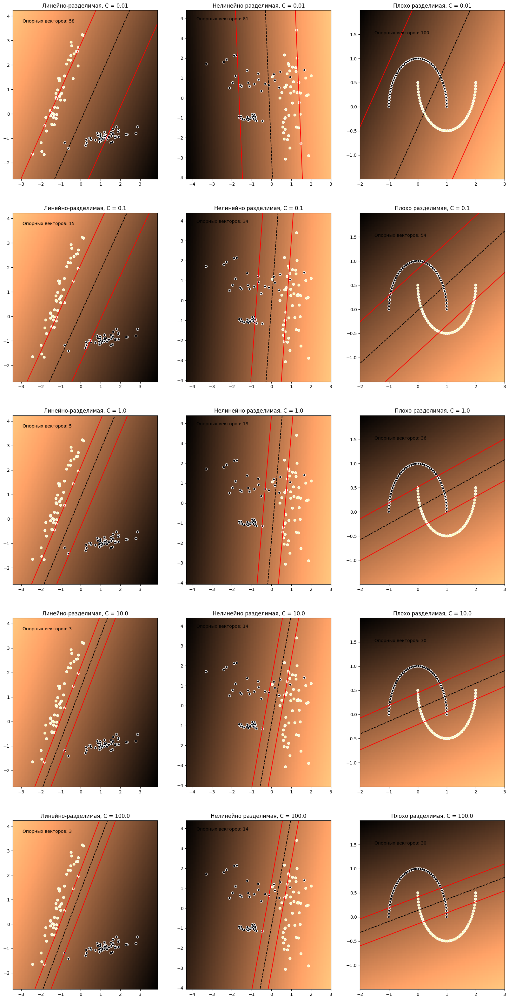

In [43]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(len(C), 3, figsize=(20,40))
for i in range(3):
    y[i][y[i] == 0] = -1
    for j in range(len(C)):
        visualize_svm(X[i], y[i], C[j], i, j)
        ax[j][i].set_title(titles[i]+', C = '+str(C[j]))

## При росте С уменьшается ширина полосы и, соответственно, число опорных векторов

In [44]:
def transform(X):
    transform_X = list()
    d = X.shape[1]
    for item in X:
        temp = list()
        for i in range(d):
            for j in range(i, d):
                temp.append(item[i] * item[j])
        transform_X.append(np.array(temp))
    return np.array(transform_X)

In [45]:
def visualize_transformSVM(X, y, C, i, j):
    
    model = LinearSVM(C, transform = transform)
    model.fit(X, y)

    ax[j][i].scatter(X[:, 0], X[:, 1], s=30, c=y, cmap='magma', edgecolor='white')
    ax[j][i].scatter(model.vect[:, 0], model.vect[:, 1], s=100, marker='.', 
                     c=model.vect_class, cmap='magma', edgecolor='white')

    x1_min = np.min(X[:, 0]) - 1
    x1_max = np.max(X[:, 0]) + 1
    x2_min = np.min(X[:, 1]) - 1
    x2_max = np.max(X[:, 1]) + 1
    
    ax[j][i].set_xlim([x1_min, x1_max])
    ax[j][i].set_ylim([x2_min, x2_max])

    xvals = np.linspace(x1_min, x1_max, 100)
    yvals = np.linspace(x2_min, x2_max, 100)

    xx, yy = np.meshgrid(xvals, yvals)
    zz = model.weights_[2]*xx**2 + model.weights_[3]*xx*yy + model.weights_[4]*yy**2
    
    ax[j][i].pcolormesh(xx, yy, zz, cmap='copper', zorder=0, shading='auto')
    ax[j][i].contour(xx, yy, zz, colors=["r", "black", "r"], 
                     linestyles=["-", "--", ":"], levels=[-1, 0, 1])

     pcost       dcost       gap    pres   dres
 0:  2.8200e-01  3.1195e+00  4e+02  2e+00  2e+02
 1:  1.6689e+00 -5.7317e+00  8e+00  3e-02  4e+00
 2:  1.1875e+00  2.2472e-01  1e+00  3e-04  4e-02
 3:  3.7575e-01  2.8348e-01  9e-02  3e-05  4e-03
 4:  3.3452e-01  3.0417e-01  3e-02  8e-06  1e-03
 5:  3.2114e-01  3.1294e-01  8e-03  1e-06  2e-04
 6:  3.1696e-01  3.1570e-01  1e-03  6e-08  8e-06
 7:  3.1642e-01  3.1612e-01  3e-04  1e-08  2e-06
 8:  3.1626e-01  3.1625e-01  9e-06  3e-10  4e-08
 9:  3.1625e-01  3.1625e-01  2e-07  5e-12  6e-10
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -4.6198e-01  1.5478e+01  4e+02  2e+00  2e+02
 1:  1.2264e+01 -8.6092e+00  2e+01  5e-02  6e+00
 2:  2.3423e+00  2.8354e-01  2e+00  4e-04  4e-02
 3:  9.3789e-01  4.6604e-01  5e-01  8e-05  9e-03
 4:  7.4152e-01  5.4088e-01  2e-01  2e-05  2e-03
 5:  6.6511e-01  5.7669e-01  9e-02  8e-06  9e-04
 6:  6.2962e-01  5.9168e-01  4e-02  2e-06  3e-04
 7:  6.1180e-01  6.0251e-01  9e-03  4e-07  4e-0

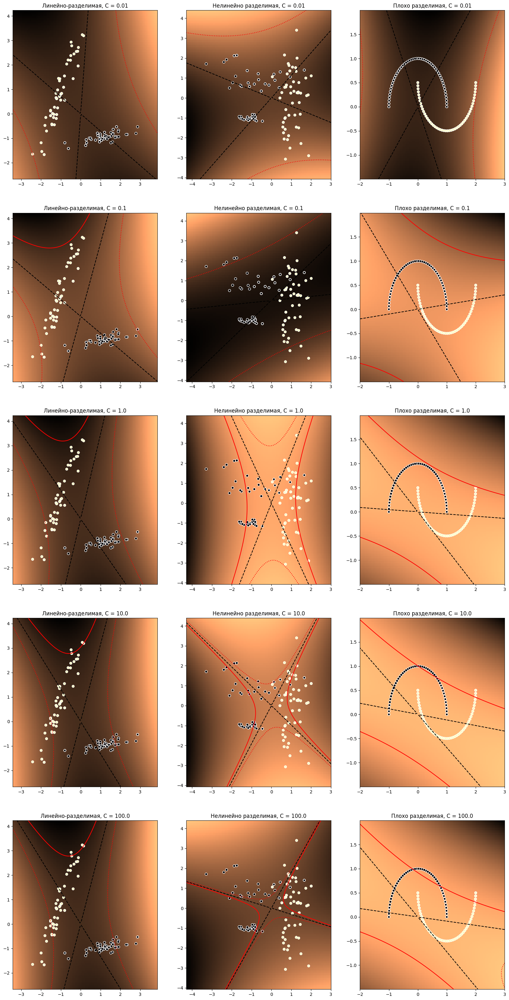

In [46]:
fig, ax = plt.subplots(len(C), 3, figsize=(20,40))
for i in range(3):
    y[i][y[i] == 0] = -1
    for j in range(len(C)):
        visualize_transformSVM(X[i], y[i], C[j], i, j)
        ax[j][i].set_title(titles[i]+', C = '+str(C[j]))

## Видно, что выборка с линейно-разделимыми классами обучается лучше, чем с другими.

# 3. Двойственный переход и Ядровой SVM

Задачу обучения линейного SVM, рассмотренную в предыдущем пункте принято называть _прямой_ оптимизационной задачей для SVM. Любая задача оптимизации с ограничениями имеет [_двойственную_ задачу Лагранжа](http://goo.gl/OujTPr), в которой оптимизируются _двойственные переменные_ (множители Лагранжа), соответствующие штрафу за нарушение ограничений, максимизируется нижняя оценка функционала прямой задачи. В случае задачи квадратичного программирования, решение двойственной задачи (значение оптимизируемого функционала) совпадает с оптимумом прямой задачи.

Подробнее можно почитать в [статье](./SMAIS11_SVM.pdf).

Двойственная задача для SVM имеет вид:
$$
\begin{gather}
    \sum_{n} \alpha_n - \frac{1}{2}\sum_{n}\sum_{n'} \alpha_{n}\alpha_{n'} y_{n}y_{n'} x_{n}^Tx_{n'} \to \max_{\alpha} \\
    \begin{aligned}
        \text{s.t. } \quad  
        & 0 \le \alpha_n \le C, \quad \forall n = 1, \dots, N \\
        & \sum_{n} \alpha_n y_n = 0
    \end{aligned}
\end{gather}
$$

Оптимизируется вектор из двойственных переменных $\alpha_n$, соответствующих объектам обучающей выборки. Объект $x_n$ является опорным, если $\alpha_n > 0$.

Предсказание вычисляется по следующему правилу:
$$\hat{y}(x) = \text{sign}\left(\sum_{n}\alpha_{n}y_{n}x^Tx_{n} + b\right).$$

Для предсказания необходимо оценить значение $b$. Известно, что для любого опорного объекта, который классифицируется безошибочно верно:
$$y_n = \sum_{n'}\alpha_{n}y_{n}x_{n}^Tx_{n'} + b,$$
значит для любого такого объекта:
$$b = y_n - \sum_{n'}\alpha_{n}y_{n}x_{n}^Tx_{n'}.$$

В случае наличия ошибок классификации обучающей выборки, предлагается усреднять значение $b$ по всем опорным векторам:
$$b = \frac{1}{N_\text{SV}}\sum_{n \in \text{SV}}\left(y_n - \sum_{n'}\alpha_{n}y_{n}x_{n}^Tx_{n'}\right).$$
Интуиция здесь такова, что суммарные ошибки в положительную сторону примерно равны суммарным ошибкам в отрицательную сторону.

Другой вариант — отказаться от параметра $b$ и работать с моделью $f(x) = w^Tx$, добавив к вектору $x$ константный признак.

#### Неявное преобразование признаков
Отметим, что двойственная задача SVM содержит вектора признаков исключительно в виде скалярного произведения $x^Tx'$. Эта особенность позволяет производить неявное преобразование признакового пространства. Вместо вычисления функции $\phi(\boldsymbol x)$, которая может отображать исходные признаки в вектора очень большой размерности, будем вычислять скалярное произведение $k(\boldsymbol x, \boldsymbol x') = \phi(\boldsymbol x)^T\phi(\boldsymbol x')$ называемое _ядром_. 

#### Задание
  1. Реализуйте процедуру обучения ядрового SVM, используя QP-солвер.
  2. Протестируйте на случайных двумерных выборках ядровой SVM. Покажите на плоскости строящиеся разделяющие поверхности, линии уровня, ограничивающие коридор $f(\boldsymbol x) = \pm 1$. Выделите опорные вектора точками другой формы или большего размера. Попробуйте следующие ядровые функции:
    - линейная: $k(x, x') = x^Tx'$
    - полиномиальная: $k(x, x') = (x^Tx' + 1)^p$ с различными степенями $p = 2,3,\dots$
    - Гауссовская-RBF: $k(x, x') = \exp(-\frac{1}{2\gamma}\|x - x'\|^2)$
  3. Как ведет себя SVM с полиномиальным ядром в зависимости от параметров $C$ и степени ядра $p$?
  4. Как ведет себя SVM с RBF-ядром в зависимости от параметров $C$ и $\gamma$? Поварьируйте параметры $C$ и $\gamma$ по логарифмической сетке. Какие значения параметров ведут к переобучению, а какие — к слишком грубой модели?

In [47]:
class DualSVM(BaseEstimator):
    
    def __init__(self, C=1, kernel="linear", power=None, gamma=None):
        self.C = C
        self.kernel = kernel
        self.power = power
        self.gamma = gamma
        
    def _linear(self, x1, x2):
        return np.dot(x1, x2)
    
    def _poly(self, x1, x2, power):
        return (np.dot(x1, x2) + 1) ** power
        
    def _rbf(self, x1, x2, gamma):
        distance = np.linalg.norm(x1 - x2) ** 2
        return np.exp(-gamma * distance)
    
    def fit(self, X, y):
        N, dim = X.shape
        K = np.zeros((N, N))
        for i in range(N):
            for j in range(N):
                if self.kernel == "linear": 
                    K[i, j] = self._linear(X[i], X[j])
                elif self.kernel == "poly": 
                    K[i, j] = self._poly(X[i], X[j], self.power)
                else: 
                    K[i, j] = self._rbf(X[i], X[j], self.gamma)
        
        P = matrix(np.outer(y, y) * K, tc='d')
        q = matrix(-np.ones(N), tc='d')
        G = matrix(np.vstack((np.eye(N), -np.eye(N))), tc='d')
        h = matrix(np.hstack((self.C * np.ones(N), np.zeros(N))), tc='d')
        A = matrix(y.reshape(1, N), tc='d')  
        b = matrix(0, tc='d')                   
        sol = solvers.qp(P, q, G, h, A, b)
        self.alpha = np.array(sol['x']).flatten()
        
        ind = self.alpha > 1e-6
        self.sup_alpha = self.alpha[ind]
        self.sup_vect = X[ind]
        self.sup_vect_class = y[ind]
        
        self.b = list()
        for i in range(len(self.sup_vect)):
            temp = 0
            for j in range(len(self.sup_vect)):
                if self.kernel == "linear": 
                    temp += self._linear(self.sup_vect[i], self.sup_vect[j])
                elif self.kernel == "poly": 
                    temp += self._poly(self.sup_vect[i], self.sup_vect[j], self.power)
                else: 
                    temp += self._rbf(self.sup_vect[i], self.sup_vect[j], self.gamma)
            self.b.append(self.sup_vect_class[i] - self.sup_alpha[i]*self.sup_vect_class[i]*temp)
        self.b = np.array(self.b).mean()
        
    def predict_proba(self, X):
        y_pred = []
        for item in X:
            prediction = 0
            for i in range(len(self.sup_alpha)):
                if self.kernel == "linear":
                    prediction += self.sup_alpha[i] * self.sup_vect_class[i] * self._linear(self.sup_vect[i], item)
                elif self.kernel == "poly":
                    prediction += self.sup_alpha[i] * self.sup_vect_class[i] * self._poly(self.sup_vect[i], item, self.power)
                else:
                    prediction += self.sup_alpha[i] * self.sup_vect_class[i] * self._rbf(self.sup_vect[i], item, self.gamma)
            prediction += self.b
            y_pred.append(prediction)
        return np.array(y_pred)        
            
    def predict(self, X):
        return np.sign(self.predict_proba(X))

In [54]:
def visualize_DualSVM(X, y, i, j, C=1, kernel='linear', power=None, gamma=None):
    
    model = DualSVM(C = C, kernel = kernel, power = power, gamma = gamma)
    model.fit(X, y)

    ax[j][i].scatter(X[:, 0], X[:, 1], s=30, c=y, cmap='magma', edgecolor='yellow')
    ax[j][i].scatter(model.sup_vect[:, 0], model.sup_vect[:, 1], s=100, marker='.', 
                     c=model.sup_vect_class, cmap='magma', edgecolor='yellow')

    x1_min = np.min(X[:, 0]) - 1
    x1_max = np.max(X[:, 0]) + 1
    x2_min = np.min(X[:, 1]) - 1
    x2_max = np.max(X[:, 1]) + 1
    
    ax[j][i].set_xlim([x1_min, x1_max])
    ax[j][i].set_ylim([x2_min, x2_max])

    xvals = np.linspace(x1_min, x1_max, 100)
    yvals = np.linspace(x2_min, x2_max, 100)

    xx, yy = np.meshgrid(xvals, yvals)
    zz = np.reshape(model.predict_proba(np.c_[xx.ravel(), yy.ravel()]), xx.shape)
    
    ax[j][i].pcolormesh(xx, yy, zz, cmap='copper', zorder=0, shading='auto')
    ax[j][i].contour(xx, yy, zz, colors=["r", "black", "r"], linestyles=["-", "--", "-"], levels=[-1, 0, 1])

     pcost       dcost       gap    pres   dres
 0: -7.9357e+00 -1.8000e+02  9e+02  2e+00  2e-15
 1: -3.8753e+00 -9.0549e+01  1e+02  3e-01  2e-15
 2: -1.1866e+00 -1.5982e+01  2e+01  3e-02  5e-15
 3: -1.5778e+00 -6.4239e+00  6e+00  8e-03  2e-15
 4: -2.0146e+00 -3.3805e+00  2e+00  2e-03  9e-16
 5: -2.2763e+00 -2.6266e+00  4e-01  1e-04  1e-15
 6: -2.3847e+00 -2.4597e+00  8e-02  2e-05  1e-15
 7: -2.4166e+00 -2.4187e+00  2e-03  1e-07  1e-15
 8: -2.4176e+00 -2.4176e+00  2e-05  1e-09  1e-15
 9: -2.4176e+00 -2.4176e+00  2e-07  1e-11  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.8271e+00 -1.3315e+02  6e+02  2e+00  5e-15
 1: -1.2970e+00 -5.1630e+01  7e+01  1e-01  4e-15
 2: -4.4112e-01 -9.7919e+00  1e+01  2e-02  3e-15
 3: -4.5715e-01 -2.2721e+00  2e+00  3e-03  2e-15
 4: -5.9478e-01 -1.2310e+00  7e-01  1e-03  1e-15
 5: -6.5316e-01 -9.8260e-01  3e-01  2e-04  1e-15
 6: -7.6438e-01 -7.7728e-01  1e-02  5e-06  1e-15
 7: -7.6859e-01 -7.6874e-01  2e-04  5e-08  1e-1

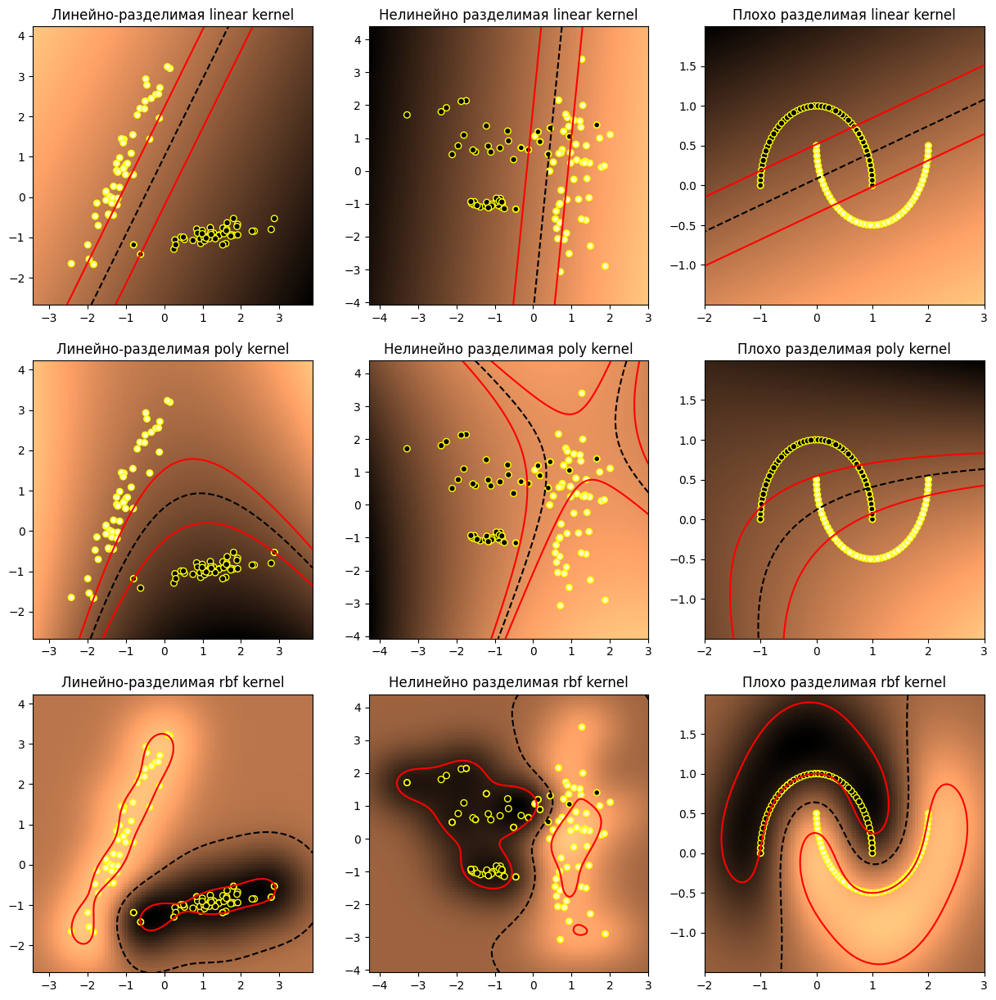

In [56]:
fig, ax = plt.subplots(3, 3, figsize=(15,15))
kernels = ['linear', 'poly', 'rbf']
for i in range(3):
    for j in range(3):
        visualize_DualSVM(X[i], y[i], i, j, kernel = kernels[j], power = 2, gamma = 1)
        ax[j][i].set_title(titles[i]+' '+kernels[j]+' kernel')

     pcost       dcost       gap    pres   dres
 0: -1.5697e+00 -1.5759e+00  4e+02  2e+01  2e-15
 1: -1.8804e-01 -1.5610e+00  7e+00  3e-01  2e-15
 2: -1.5533e-01 -1.0267e+00  1e+00  1e-02  5e-16
 3: -1.6337e-01 -2.5632e-01  1e-01  1e-03  4e-16
 4: -1.8413e-01 -2.1395e-01  3e-02  3e-04  3e-16
 5: -1.9040e-01 -2.0609e-01  2e-02  1e-04  3e-16
 6: -1.9401e-01 -2.0028e-01  6e-03  4e-05  3e-16
 7: -1.9605e-01 -1.9770e-01  2e-03  5e-06  3e-16
 8: -1.9671e-01 -1.9680e-01  1e-04  8e-08  4e-16
 9: -1.9675e-01 -1.9675e-01  3e-06  2e-09  3e-16
10: -1.9675e-01 -1.9675e-01  8e-08  3e-11  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.6955e+00 -1.3975e+01  4e+02  2e+01  2e-15
 1: -4.0515e-01 -1.2349e+01  2e+01  5e-01  2e-15
 2: -1.7754e-01 -2.1005e+00  2e+00  1e-02  7e-16
 3: -2.9508e-01 -7.8500e-01  5e-01  3e-03  5e-16
 4: -3.5513e-01 -4.7306e-01  1e-01  4e-04  5e-16
 5: -3.6557e-01 -4.5516e-01  9e-02  2e-04  4e-16
 6: -3.8807e-01 -4.0907e-01  2e-02  3e-05  5e-1

     pcost       dcost       gap    pres   dres
 0:  6.4693e+00 -2.8920e+03  7e+03  4e-01  9e-13
 1:  1.1248e+01 -5.9559e+02  1e+03  4e-02  5e-13
 2:  3.8216e+00 -5.7637e+01  9e+01  3e-03  2e-13
 3:  1.6178e+00 -8.7864e+00  1e+01  3e-04  3e-14
 4:  5.2745e-01 -2.5079e+00  3e+00  5e-05  6e-15
 5:  4.1651e-02 -2.2144e-01  3e-01  4e-07  8e-15
 6: -3.1060e-02 -1.0244e-01  7e-02  1e-07  3e-15
 7: -5.4093e-02 -7.9808e-02  3e-02  3e-08  1e-15
 8: -6.5034e-02 -8.1660e-02  2e-02  6e-09  9e-16
 9: -7.0455e-02 -7.3478e-02  3e-03  1e-09  2e-15
10: -7.1754e-02 -7.1827e-02  7e-05  1e-11  3e-15
11: -7.1790e-02 -7.1790e-02  7e-07  1e-13  2e-15
12: -7.1790e-02 -7.1790e-02  7e-09  1e-15  1e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  1.2839e+03 -1.8359e+05  4e+05  2e-01  7e-12
 1:  1.0962e+03 -5.0956e+04  9e+04  4e-02  8e-12
 2:  3.8568e+02 -4.3475e+03  7e+03  3e-03  1e-12
 3:  1.6080e+02 -7.7754e+02  1e+03  3e-04  3e-13
 4:  5.3417e+01 -1.7428e+02  3e+02  4e-05  7e-1

     pcost       dcost       gap    pres   dres
 0: -9.1504e+00 -1.9443e+01  7e+02  3e+01  3e-13
 1: -1.5266e+00 -1.7913e+01  3e+01  6e-01  3e-13
 2: -1.2967e+00 -7.5505e+00  9e+00  1e-01  6e-14
 3: -1.2309e+00 -5.1408e+00  5e+00  7e-02  4e-14
 4: -1.2597e+00 -2.4296e+00  1e+00  2e-02  3e-14
 5: -1.3186e+00 -1.5888e+00  3e-01  3e-03  1e-14
 6: -1.3485e+00 -1.4215e+00  8e-02  3e-04  2e-14
 7: -1.3667e+00 -1.3808e+00  1e-02  3e-05  9e-15
 8: -1.3716e+00 -1.3724e+00  8e-04  7e-07  2e-14
 9: -1.3720e+00 -1.3720e+00  2e-05  1e-08  1e-14
10: -1.3720e+00 -1.3720e+00  8e-07  2e-10  7e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.6296e+01 -1.8646e+02  9e+02  2e+00  3e-13
 1: -1.0291e+01 -9.4720e+01  1e+02  2e-01  2e-13
 2: -9.4842e+00 -4.7501e+01  5e+01  6e-02  2e-13
 3: -8.3239e+00 -3.2071e+01  3e+01  3e-02  1e-13
 4: -8.1552e+00 -1.7765e+01  1e+01  8e-03  7e-14
 5: -8.3514e+00 -1.0588e+01  3e+00  2e-03  9e-14
 6: -8.5853e+00 -9.1051e+00  6e-01  3e-04  9e-1

     pcost       dcost       gap    pres   dres
 0: -1.3064e+00 -2.0981e+00  3e+02  2e+01  3e-15
 1: -9.4855e-01 -1.8259e+00  2e+01  1e+00  2e-15
 2: -4.2484e-01 -1.3832e+00  2e+00  5e-02  2e-15
 3: -3.5976e-01 -6.0498e-01  3e-01  3e-03  1e-15
 4: -3.7500e-01 -4.2323e-01  5e-02  6e-04  5e-16
 5: -3.8193e-01 -3.9731e-01  2e-02  2e-04  4e-16
 6: -3.8534e-01 -3.8956e-01  4e-03  3e-05  9e-16
 7: -3.8665e-01 -3.8732e-01  7e-04  4e-06  7e-16
 8: -3.8691e-01 -3.8694e-01  4e-05  2e-07  7e-16
 9: -3.8692e-01 -3.8692e-01  5e-07  3e-09  8e-16
10: -3.8692e-01 -3.8692e-01  5e-09  3e-11  7e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.3416e+00 -1.2948e+01  3e+02  2e+01  4e-15
 1: -1.0691e+00 -1.1446e+01  2e+01  3e-01  4e-15
 2: -9.8712e-01 -2.5841e+00  2e+00  2e-02  3e-15
 3: -1.0626e+00 -1.3690e+00  3e-01  3e-03  2e-15
 4: -1.1082e+00 -1.1790e+00  7e-02  5e-04  4e-15
 5: -1.1231e+00 -1.1454e+00  2e-02  1e-04  2e-15
 6: -1.1287e+00 -1.1327e+00  4e-03  1e-05  3e-1

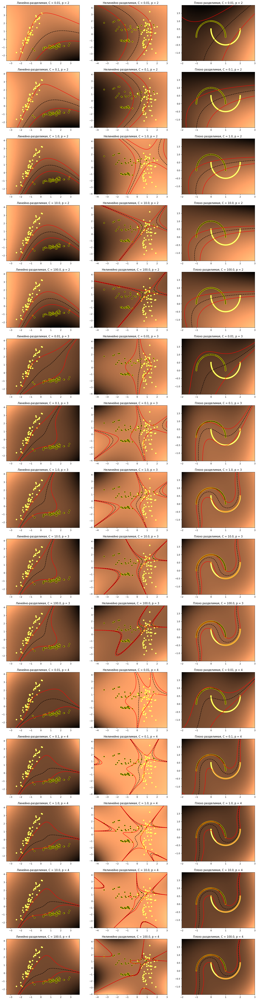

In [58]:
powers = np.arange(2,5)
cvals, pvals = np.meshgrid(C, powers)
pp = pvals.flatten()
cc = cvals.flatten()
fig, ax = plt.subplots(len(pp), 3, figsize=(20,80))
for i in range(3):
    for j in range(len(pp)):
        visualize_DualSVM(X[i], y[i], i, j, cc[j], 'poly', pp[j])
        ax[j][i].set_title(titles[i] + ', C = ' + str(cc[j]) + ', p = ' + str(pp[j]))

## Ответ: Величина С влияет на ширину полосы, с ростом С уменьшается ширина полосы и число опорных векторов. Кроме того, с повышением степени полинома р лучше строятся границы классов.

     pcost       dcost       gap    pres   dres
 0: -1.3651e+01 -6.8771e+00  5e+02  2e+01  6e-16
 1: -6.6507e+00 -3.2372e+00  3e+01  2e+00  7e-16
 2: -8.3035e-01 -2.0685e+00  1e+00  2e-16  1e-15
 3: -9.2702e-01 -1.0123e+00  9e-02  2e-17  8e-16
 4: -9.7996e-01 -9.8090e-01  9e-04  2e-17  5e-16
 5: -9.8051e-01 -9.8052e-01  9e-06  2e-17  5e-16
 6: -9.8052e-01 -9.8052e-01  9e-08  2e-17  6e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.4366e+01 -2.2917e+01  5e+02  2e+01  6e-16
 1: -8.7922e+00 -1.9905e+01  3e+01  7e-01  7e-16
 2: -7.4024e+00 -1.0543e+01  3e+00  2e-16  8e-16
 3: -7.9718e+00 -8.0871e+00  1e-01  2e-16  5e-16
 4: -8.0508e+00 -8.0520e+00  1e-03  2e-16  6e-16
 5: -8.0517e+00 -8.0517e+00  1e-05  2e-16  6e-16
 6: -8.0517e+00 -8.0517e+00  1e-07  2e-16  5e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.6993e+01 -1.6557e+02  5e+02  2e+00  1e-15
 1: -1.4720e+01 -8.5850e+01  7e+01  4e-16  1e-15
 2: -1.8267e+01 -2.9010e

     pcost       dcost       gap    pres   dres
 0: -9.0723e+00 -5.8606e+00  4e+02  2e+01  2e-16
 1: -5.1175e+00 -3.1681e+00  2e+01  1e+00  4e-16
 2: -9.5222e-01 -1.9261e+00  1e+00  2e-02  1e-15
 3: -9.2441e-01 -1.0032e+00  8e-02  6e-04  5e-16
 4: -9.6139e-01 -9.6232e-01  1e-03  7e-06  3e-16
 5: -9.6186e-01 -9.6187e-01  1e-05  7e-08  3e-16
 6: -9.6187e-01 -9.6187e-01  1e-07  7e-10  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.4561e+00 -1.9592e+01  4e+02  2e+01  3e-16
 1: -6.6125e+00 -1.7302e+01  2e+01  7e-01  3e-16
 2: -5.8417e+00 -8.5946e+00  3e+00  2e-16  6e-16
 3: -6.1755e+00 -6.4263e+00  3e-01  2e-16  3e-16
 4: -6.2504e+00 -6.3508e+00  1e-01  4e-16  2e-16
 5: -6.2896e+00 -6.3046e+00  1e-02  2e-16  2e-16
 6: -6.2958e+00 -6.2982e+00  2e-03  2e-16  2e-16
 7: -6.2969e+00 -6.2971e+00  3e-04  2e-16  2e-16
 8: -6.2970e+00 -6.2970e+00  6e-06  2e-16  2e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -9.4740e+00 -1.3833e

     pcost       dcost       gap    pres   dres
 0: -1.4073e+01 -2.3543e+01  8e+02  3e+01  7e-16
 1: -4.4603e+00 -2.2408e+01  2e+01  1e-01  7e-16
 2: -4.6303e+00 -6.6759e+00  2e+00  1e-02  4e-16
 3: -5.1218e+00 -5.5358e+00  4e-01  2e-03  4e-16
 4: -5.3052e+00 -5.3659e+00  6e-02  2e-04  5e-16
 5: -5.3260e+00 -5.3458e+00  2e-02  5e-05  4e-16
 6: -5.3339e+00 -5.3372e+00  3e-03  6e-06  5e-16
 7: -5.3355e+00 -5.3356e+00  4e-05  6e-08  4e-16
 8: -5.3355e+00 -5.3355e+00  4e-07  6e-10  4e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -2.1505e+01 -2.2361e+02  1e+03  3e+00  1e-15
 1: -1.1229e+01 -1.3370e+02  1e+02  3e-02  1e-15
 2: -1.5744e+01 -3.2814e+01  2e+01  4e-03  8e-16
 3: -1.8176e+01 -2.5884e+01  8e+00  2e-03  9e-16
 4: -1.9809e+01 -2.2121e+01  2e+00  3e-04  8e-16
 5: -2.0394e+01 -2.1126e+01  7e-01  9e-05  9e-16
 6: -2.0595e+01 -2.0812e+01  2e-01  2e-05  1e-15
 7: -2.0654e+01 -2.0721e+01  7e-02  3e-06  8e-16
 8: -2.0682e+01 -2.0685e+01  2e-03  7e-08  1e-1

     pcost       dcost       gap    pres   dres
 0: -2.4948e+01 -2.3233e+01  4e+02  2e+01  2e-16
 1: -1.0371e+01 -1.8433e+01  2e+01  6e-01  4e-16
 2: -8.6484e+00 -1.0762e+01  2e+00  2e-16  5e-16
 3: -9.1768e+00 -9.2200e+00  4e-02  2e-16  3e-16
 4: -9.1994e+00 -9.1998e+00  4e-04  2e-16  2e-16
 5: -9.1996e+00 -9.1996e+00  4e-06  2e-16  3e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.4961e+01 -1.5480e+02  1e+02  3e-15  4e-16
 1: -3.6464e+01 -4.4067e+01  8e+00  1e-15  3e-16
 2: -3.8007e+01 -3.8985e+01  1e+00  1e-15  1e-16
 3: -3.8248e+01 -3.8410e+01  2e-01  6e-16  1e-16
 4: -3.8295e+01 -3.8302e+01  6e-03  3e-16  1e-16
 5: -3.8297e+01 -3.8297e+01  2e-04  3e-16  9e-17
 6: -3.8297e+01 -3.8297e+01  6e-06  2e-16  1e-16
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7965e+02 -3.2502e+03  4e+03  3e-15  2e-15
 1:  5.8333e+01 -3.2571e+02  4e+02  3e-15  1e-15
 2: -3.2273e+01 -7.7240e+01  4e+01  2e-15  4e-16
 3: -3.8345e+01 -4.1299e

     pcost       dcost       gap    pres   dres
 0:  2.9295e+02 -2.3415e+03  3e+03  2e-15  4e-15
 1:  5.2078e+01 -2.4851e+02  3e+02  2e-15  4e-15
 2: -7.2014e+00 -3.5324e+01  3e+01  2e-16  2e-15
 3: -1.4565e+01 -1.9055e+01  4e+00  2e-16  2e-15
 4: -1.6128e+01 -1.7377e+01  1e+00  9e-16  2e-15
 5: -1.6469e+01 -1.6756e+01  3e-01  2e-15  2e-15
 6: -1.6542e+01 -1.6728e+01  2e-01  5e-15  2e-15
 7: -1.6611e+01 -1.6627e+01  2e-02  4e-15  2e-15
 8: -1.6618e+01 -1.6619e+01  6e-04  9e-16  2e-15
 9: -1.6619e+01 -1.6619e+01  8e-06  2e-15  2e-15
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.4117e+04 -1.3003e+05  2e+05  7e-15  4e-14
 1:  7.9002e+03 -1.4841e+04  2e+04  7e-15  3e-14
 2:  1.1351e+03 -1.7775e+03  3e+03  1e-14  2e-14
 3:  1.3062e+02 -2.5708e+02  4e+02  6e-15  7e-15
 4:  8.5308e-01 -5.1800e+01  5e+01  2e-16  3e-15
 5: -1.2838e+01 -2.1857e+01  9e+00  3e-15  1e-15
 6: -1.5705e+01 -1.7376e+01  2e+00  2e-15  2e-15
 7: -1.6400e+01 -1.6774e+01  4e-01  3e-15  2e-1

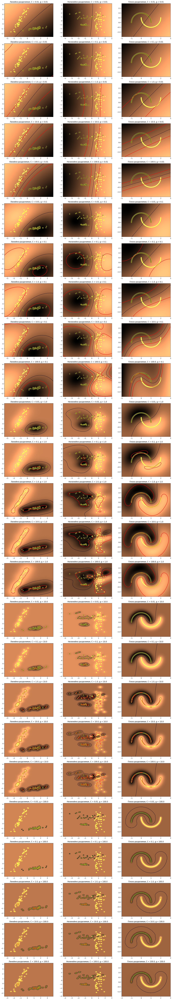

In [59]:
gammas = 10. ** np.arange(-2,3)
cvals, gvals = np.meshgrid(C, gammas)
gg = gvals.flatten()
cc = cvals.flatten()
fig, ax = plt.subplots(len(gg), 3, figsize=(20,120))
for i in range(3):
    for j in range(len(gg)):
        visualize_DualSVM(X[i], y[i], i, j, cc[j], 'rbf', gamma = gg[j])
        ax[j][i].set_title(titles[i] + ', C = ' + str(cc[j]) + ', g = ' + str(gg[j]))

## Для RBF-ядер мы наблюдаем грубую модель при слишком малых С, а слишком большие g ведут к переобучению.

# Примеры

Настройка вывода графиков [`Maplotlib`](http://matplotlib.org/) и импорт функций из модуля [`pylab`](http://wiki.scipy.org/PyLab).

In [22]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


C:\Anaconda3\lib\site-packages\IPython\core\magics\pylab.py:160: UserWarning: pylab import has clobbered these variables: ['matrix']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


## Визуальное решение задачи квадратичного программирования

На следующем рисунке наглядно показано решение задачи QP из задания 1. Оптимизируемая функция $f(\boldsymbol x)$ показана линиями уровня, область значений недопустимых ограничениями окрашена в серый цвет.

C:\Anaconda3\lib\site-packages\matplotlib\contour.py:902: UserWarning: linewidths is ignored by contourf
  warnings.warn('linewidths is ignored by contourf')


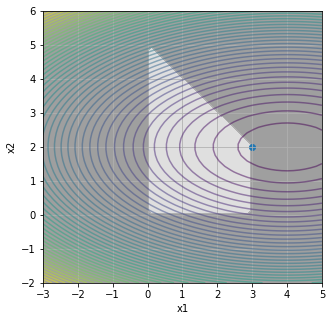

In [33]:
x1 = linspace(-3, 5, 50)
x2 = linspace(-2, 6, 50)
xx1, xx2 = meshgrid(x1, x2)

f = -8*xx1 - 16*xx2 + xx1**2 + 4*xx2**2
constr1 = (xx1 + xx2 <= 5)
constr2 = (0 <= xx1) & (xx1 <= 3)
constr3 = (xx2 >= 0)

figure(figsize=(5, 5))
grid(True)
xlabel('x1')
ylabel('x2')

contour(x1, x2, f, 50, alpha=0.5)
contourf(x1, x2, constr1 & constr2 & constr3, 1, alpha=0.5, linewidths=4, cmap='gray')
_ = scatter([3], [2])

In [26]:
np.array([True, False, False]) & np.array([True, False, True])

array([ True, False, False])

In [27]:
np.logical_and(np.array([True, False, False]), np.array([True, False, True]))

array([ True, False, False])

## Установка и использование `CvxOpt`

Библиотека [`cvxopt`](http://cvxopt.org/) может быть установлена как обычный python-пакет:

In [5]:
!pip install --upgrade --user cvxopt

  Using cached https://files.pythonhosted.org/packages/16/a0/0d090735e2639a74d6628831e02cc59284e3a3a4f5910f496fc6e435b645/cvxopt-1.2.5-cp36-cp36m-win_amd64.whl
  Using cached https://files.pythonhosted.org/packages/56/39/537cb3e4e93f1ac5085dc3b3a43cfd99d0af9b29c44fcaa99490f526b611/mkl-2019.0-py2.py3-none-win_amd64.whl


Нас будет интересовать функция [`cvxopt.solvers.qp()`](http://cvxopt.org/examples/tutorial/qp.html):

In [6]:
from cvxopt import solvers
?solvers.qp

## Пример работы с cvxopt

In [4]:
from cvxopt import matrix

A = matrix([1.0, 2.0, 3.0, 4.0, 5.0, 6.0], (2,3))
print(A)
print(A.size)

[ 1.00e+00  3.00e+00  5.00e+00]
[ 2.00e+00  4.00e+00  6.00e+00]

(2, 3)


In [6]:
G = matrix([[-1.0,0.0,-1.0,2.0,3.0],
            [0.0,-1.0,-3.0,5.0,4.0]])
print(G, G.size)

[-1.00e+00  0.00e+00]
[ 0.00e+00 -1.00e+00]
[-1.00e+00 -3.00e+00]
[ 2.00e+00  5.00e+00]
[ 3.00e+00  4.00e+00]
 (5, 2)


In [13]:
from cvxopt import solvers

# Define QP parameters (directly)
P = matrix([[1.0,0.0],[0.0,0.0]])
q = matrix([3.0,4.0])
G = matrix([[-1.0,0.0,-1.0,2.0,3.0],[0.0,-1.0,-3.0,5.0,4.0]])
h = matrix([0.0,0.0,-15.0,100.0,80.0])
# Define QP parameters (with NumPy)
P = matrix(numpy.diag([1,0]), tc='d')
q = matrix(numpy.array([3,4]), tc='d')
G = matrix(numpy.array([[-1,0],[0,-1],[-1,-3],[2,5],[3,4]]), tc='d')
h = matrix(numpy.array([0,0,-15,100,80]), tc='d')
# Construct the QP, invoke solver
sol = solvers.qp(P,q,G,h)
# Extract optimal value and solution
print(sol['x']) # [7.13e-07, 5.00e+00]
print(sol['primal objective']) # 20.0000061731

     pcost       dcost       gap    pres   dres
 0:  1.0780e+02 -7.6366e+02  9e+02  4e-17  4e+01
 1:  9.3245e+01  9.7637e+00  8e+01  8e-17  3e+00
 2:  6.7311e+01  3.2553e+01  3e+01  8e-17  1e+00
 3:  2.6071e+01  1.5068e+01  1e+01  7e-17  7e-01
 4:  3.7092e+01  2.3152e+01  1e+01  1e-16  4e-01
 5:  2.5352e+01  1.8652e+01  7e+00  9e-17  4e-16
 6:  2.0062e+01  1.9974e+01  9e-02  7e-17  2e-16
 7:  2.0001e+01  2.0000e+01  9e-04  8e-17  2e-16
 8:  2.0000e+01  2.0000e+01  9e-06  1e-16  2e-16
Optimal solution found.
[ 7.13e-07]
[ 5.00e+00]

20.00000617311241


In [14]:
sol

{'x': <2x1 matrix, tc='d'>,
 'y': <0x1 matrix, tc='d'>,
 's': <5x1 matrix, tc='d'>,
 'z': <5x1 matrix, tc='d'>,
 'status': 'optimal',
 'gap': 8.788553731701274e-06,
 'relative gap': 4.3942774404993765e-07,
 'primal objective': 20.00000617311241,
 'dual objective': 19.99999738455868,
 'primal infeasibility': 1.1710307819972547e-16,
 'dual infeasibility': 1.9860273225978186e-16,
 'primal slack': 7.131816408857108e-07,
 'dual slack': 1.50695110360481e-08,
 'iterations': 8}

In [19]:
print(sol['x'])

[ 7.13e-07]
[ 5.00e+00]



Матрицы задач квадратичного программирования как правило разрежены, лучше использовать матричные операции над разреженными матрицами при реализации SVM.
[Разреженные и плотные матрицы](http://abel.ee.ucla.edu/cvxopt/userguide/matrices.html)

## Генерация случайной выборки для задачи классификации

В `SciKit-Learn` есть функция генерации случайных выборок для классификации [`sklearn.datasets.make_classification()`](http://scikit-learn.org/stable/modules/generated/sklearn.datasets.make_classification.html). Для того чтобы выборки не менялись при перезапуске ноутбука, используйте параметр `random_state`.

In [7]:
from sklearn.datasets import make_classification

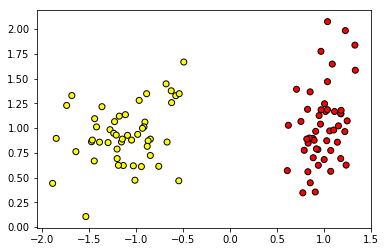

In [10]:
X, y = make_classification(n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=1, random_state=1)
scatter(X[:, 0], X[:, 1], c=y, cmap='autumn', edgecolor='black')

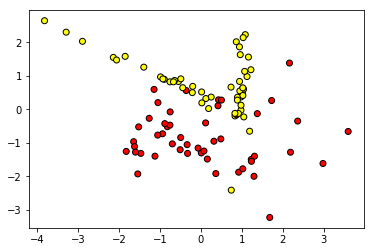

In [11]:
X, y = make_classification(n_samples=100, n_features=2, n_redundant=0, n_clusters_per_class=2, random_state=2)
scatter(X[:, 0], X[:, 1], c=y, cmap='autumn', edgecolor='black')

## Визуализация решающего правила

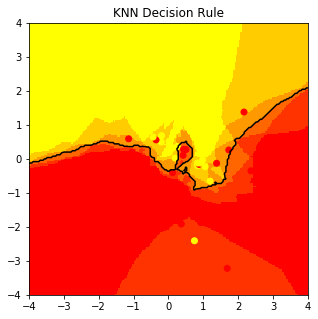

In [12]:
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=5)
model.fit(X, y)

figure(figsize=(5, 5))
scatter(X[:, 0], X[:, 1], c=y, cmap='autumn')

xvals = linspace(-4, 4, 200)
yvals = linspace(-4, 4, 200)

xx, yy = np.meshgrid(xvals, yvals)
zz = np.reshape(model.predict_proba(c_[xx.ravel(), yy.ravel()])[:, 1], xx.shape)

# Цветной фон, соответствующий значению решающего правила
pcolormesh(xx, yy, zz, cmap='autumn', zorder=0)

# Линия уровня, соответствующая значению 0.5
contour(xx, yy, zz, levels=(0.5,), colors='k', linewidths=1.5, zorder=1)

xlim([-4, 4])
ylim([-4, 4])
_ = title('KNN Decision Rule')

## Реализация собственной модели для SciKit-Learn

В заданиях 2 и 3 требуется самостоятельно реализовать алгоритм обучения классификатора. Для того чтобы ваш алгоритм можно было использовать различными компонентами библиотеки SciKit-Learn (оценка качества, подбор параметров, композиции и т.д.) нужно всего лишь [реализовать интерфейс `BaseEstimator`](http://scikit-learn.org/stable/developers/#estimators).

In [13]:
from sklearn.base import BaseEstimator

class LinearSVM(BaseEstimator):
    def __init__(self, C, transform=None):
        self.C = C
        self.transform = transform
        
    def fit(self, X, y):
        """
        Функция обучения модели.
        """
        dim = X.shape[1]
        self.weights_ = empty(dim)
        self.bias_ = 0
        raise NotImplementedError() 
        
    def predict_proba(self, X):
        return (dot(X, self.weights_) + self.bias_).flatten()
            
    def predict(self, X):
        return sign(self.predict_proba(X))

In [ ]:
from sklearn.base import BaseEstimator

class DualSVM(BaseEstimator):
    def __init__(self, C, kernel=None):
        self.C = C
        self.kernel = kernel
        
    def fit(self, X, y):
        """
        Функция обучения модели.
        """
        self.dim = X.shape[1]
        self.N = X.shape[0]
        self.alpha_ = empty(self.N)
        self.bias_ = 0
        raise NotImplementedError() 
        
    def predict_proba(self, X):
        pass
            
    def predict(self, X):
        pass